# Parallel raster calculations

In [1]:
import rioxarray

In [2]:
dem = rioxarray.open_rasterio('dem_rhodes_match.tif', masked=True)

In [5]:
dem = dem.squeeze()

In [7]:
dem.load()

<xarray.DataArray (y: 1128, x: 1143)>
array([[nan, nan, nan, ...,  0.,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]], dtype=float32)
Coordinates:
    band         int64 1
  * x            (x) float64 5.641e+05 5.641e+05 ... 6.097e+05 6.098e+05
  * y            (y) float64 4.035e+06 4.035e+06 4.035e+06 ... 3.99e+06 3.99e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Point
    scale_factor:   1.0
    add_offset:     0.0

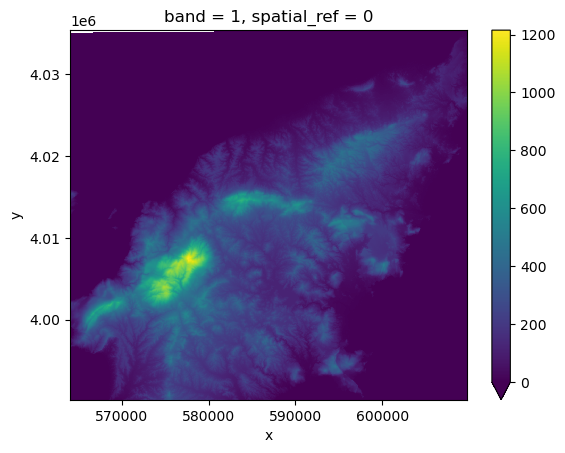

In [10]:
dem.plot(vmin=0)

In [11]:
dem.min()

<xarray.DataArray ()>
array(-2.4481893, dtype=float32)
Coordinates:
    band         int64 1
    spatial_ref  int64 0

In [13]:
dem_y = dem.sel(y=4_000_000, method='nearest')

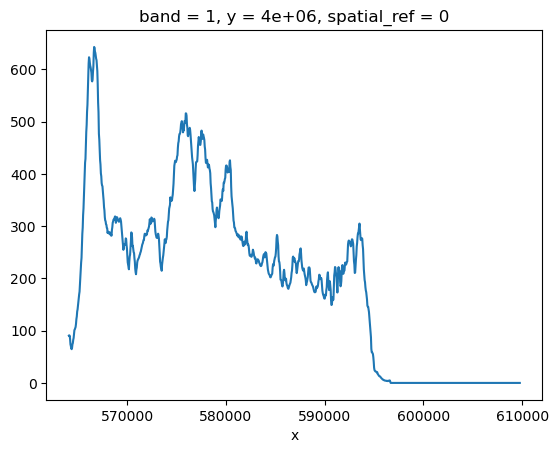

In [14]:
dem_y.plot()

In [15]:
import xrspatial
slope = xrspatial.slope(dem)

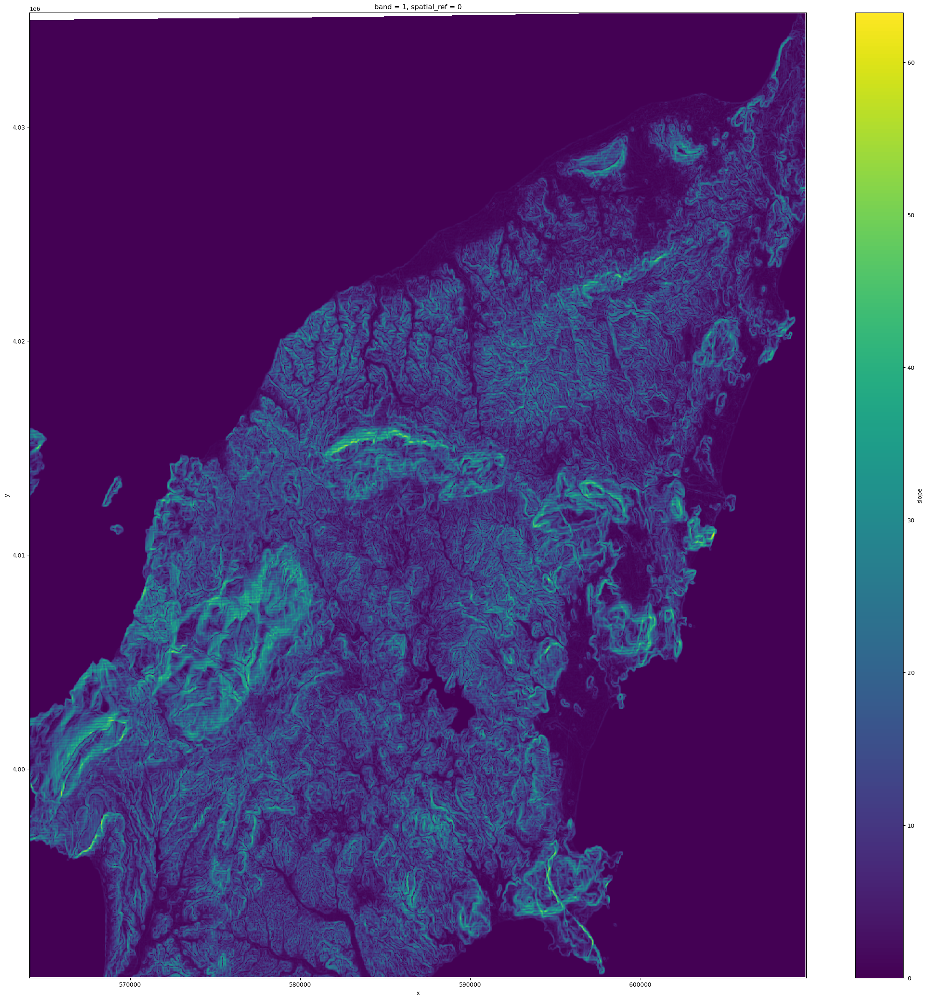

In [19]:
slope.plot.imshow(figsize=(30, 30))

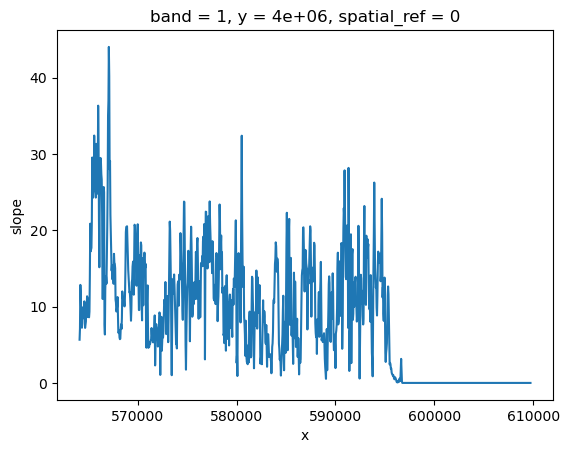

In [23]:
slope.sel(y=4_000_000, method='nearest').plot()

In [22]:
%%time 
dem_smooth = dem.rolling(x=9, y=9, center=True).median()

CPU times: user 4.63 s, sys: 1.16 s, total: 5.79 s
Wall time: 6.17 s


In [29]:
dem_smooth.min()

<xarray.DataArray ()>
array(0., dtype=float32)
Coordinates:
    band         int64 1
    spatial_ref  int64 0

In [24]:
slope_smooth = xrspatial.slope(dem_smooth)

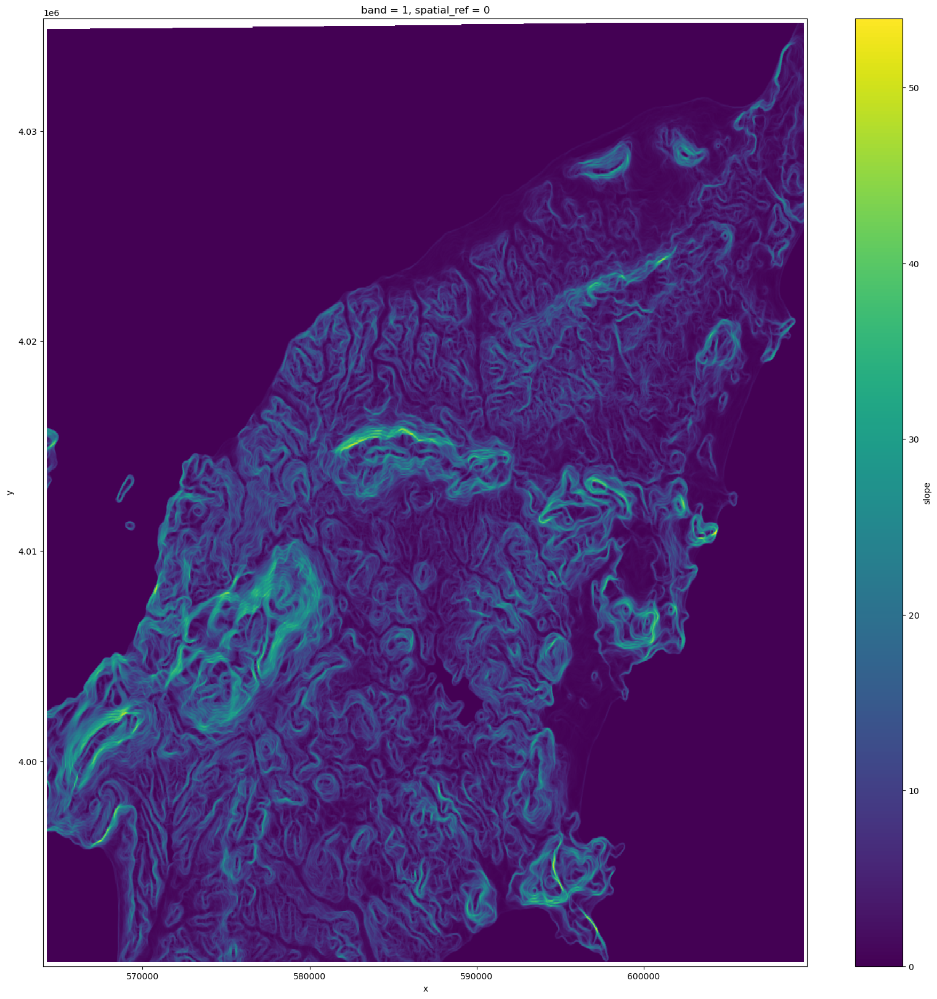

In [28]:
slope_smooth.plot(figsize=(20,20))

In [31]:
import numpy as np

In [33]:
slope_smooth_perce = np.tan(np.radians(slope_smooth))

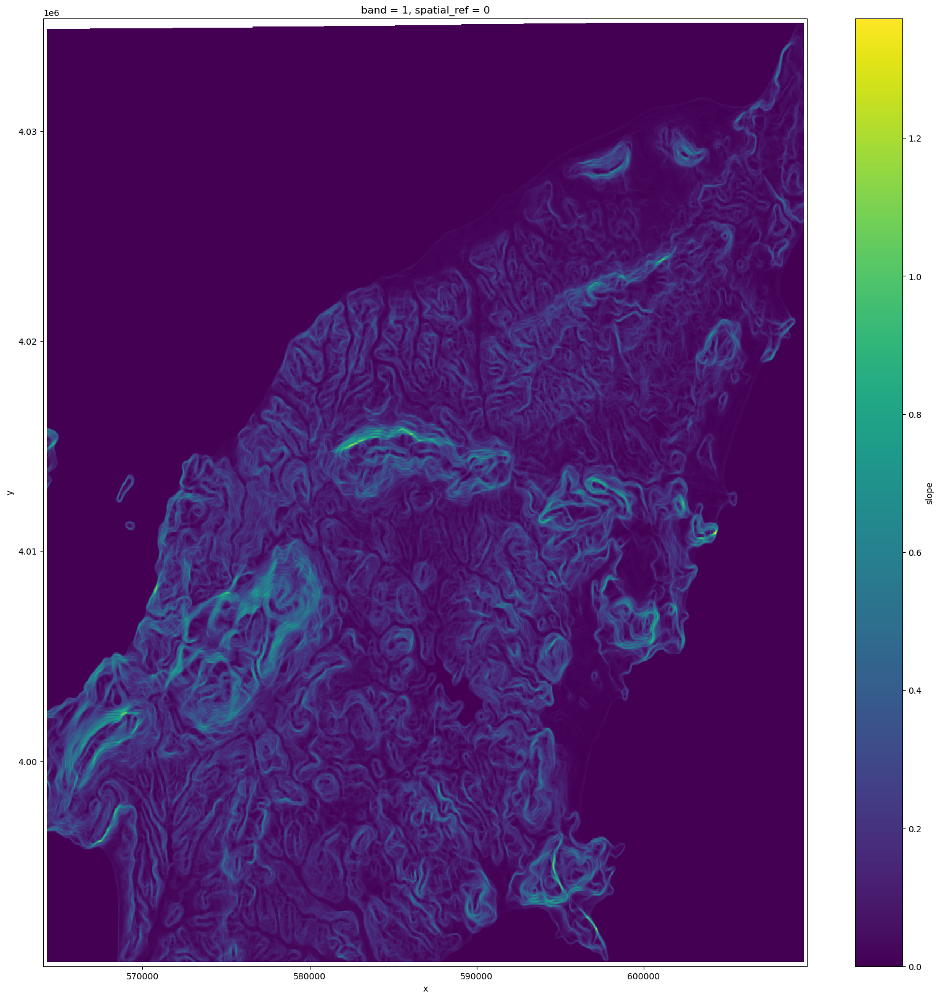

In [36]:
slope_smooth_perce.plot(figsize=(20,20))

In [34]:
slope_smooth_perce.rio.to_raster('slope.tif', driver='COG')

## Parallel rasters 

In [39]:
red = rioxarray.open_rasterio('red.tif', chunks=(1, 2000, 2000))

In [40]:
red

<xarray.DataArray (band: 1, y: 10980, x: 10980)>
dask.array<open_rasterio-3fe21a18af7ff172ec52222e67688bed<this-array>, shape=(1, 10980, 10980), dtype=uint16, chunksize=(1, 2000, 2000), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 5e+05 5e+05 5e+05 ... 6.098e+05 6.098e+05 6.098e+05
  * y            (y) float64 4.1e+06 4.1e+06 4.1e+06 ... 3.99e+06 3.99e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  AVERAGE
    _FillValue:          0
    scale_factor:        1.0
    add_offset:          0.0

### Exercise: Chunk sizes matter

We have already seen how COGs are regular GeoTIFF files with a special internal structure. Another feature of COGs is that data is organized in “blocks” that can be accessed remotely via independent HTTP requests, enabling partial file readings. This is useful if you want to access only a portion of your raster file, but it also allows for efficient parallel reading. You can check the blocksize employed in a COG file with the following code snippet:

```python
import rasterio
with rasterio.open('/path/or/URL/to/file.tif') as r:
    if r.is_tiled:
        print(f"Chunk size: {r.block_shapes}")
```

In order to optimally access COGs it is best to align the blocksize of the file with the chunks employed when loading the file. Open the red-band asset (the “red” asset) of a Sentinel-2 scene as a chunked `DataArray` object using a suitable chunk size. Which elements do you think should be considered when choosing the chunk size?

In [41]:
import rasterio
with rasterio.open('red.tif') as r:
    if r.is_tiled:
        print(f"Chunk size: {r.block_shapes}")

Chunk size: [(512, 512)]


In [43]:
!gdalinfo red.tif

Driver: GTiff/GeoTIFF
Files: red.tif
Size is 10980, 10980
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 35N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 35N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",27,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAMETER["False easting",500000,
            LENGTHUNIT["metre",1],
            ID["EPSG",8806]],
        PARAMETER[

In [45]:
red = rioxarray.open_rasterio('red.tif', chunks=(1, 6144, 6144))
red

<xarray.DataArray (band: 1, y: 10980, x: 10980)>
dask.array<open_rasterio-a8287b01c01add104e2705c085226c39<this-array>, shape=(1, 10980, 10980), dtype=uint16, chunksize=(1, 6144, 6144), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 5e+05 5e+05 5e+05 ... 6.098e+05 6.098e+05 6.098e+05
  * y            (y) float64 4.1e+06 4.1e+06 4.1e+06 ... 3.99e+06 3.99e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  AVERAGE
    _FillValue:          0
    scale_factor:        1.0
    add_offset:          0.0

In [48]:
# MB for a chunk (6144, 6144)
6144 * 6144 * 2 / 2**20 

72.0

In [49]:
red = rioxarray.open_rasterio('red.tif', chunks='auto')
red

<xarray.DataArray (band: 1, y: 10980, x: 10980)>
dask.array<open_rasterio-99f0be16603bb40b61a696518dc48c71<this-array>, shape=(1, 10980, 10980), dtype=uint16, chunksize=(1, 8192, 8192), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 5e+05 5e+05 5e+05 ... 6.098e+05 6.098e+05 6.098e+05
  * y            (y) float64 4.1e+06 4.1e+06 4.1e+06 ... 3.99e+06 3.99e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  AVERAGE
    _FillValue:          0
    scale_factor:        1.0
    add_offset:          0.0

In [50]:
dem_dask = rioxarray.open_rasterio('dem_rhodes_match.tif', masked=True, chunks=(1, 512, 512), lock=False)

In [60]:
dem_dask

<xarray.DataArray (y: 1128, x: 1143)>
dask.array<getitem, shape=(1128, 1143), dtype=float32, chunksize=(512, 512), chunktype=numpy.ndarray>
Coordinates:
    band         int64 1
  * x            (x) float64 5.641e+05 5.641e+05 ... 6.097e+05 6.098e+05
  * y            (y) float64 4.035e+06 4.035e+06 4.035e+06 ... 3.99e+06 3.99e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Point
    scale_factor:   1.0
    add_offset:     0.0

In [52]:
dem_dask = dem_dask.persist(scheduler='threads', num_workers=4)

In [55]:
dem_dask = dem_dask.squeeze()

In [56]:
%%time
dem_smooth_dask = dem_dask.rolling(x=9, y=9, center=True).median()

CPU times: user 23.3 ms, sys: 28.1 ms, total: 51.5 ms
Wall time: 68.7 ms


In [59]:
import dask
dask.visualize(dem_smooth_dask)

In [61]:
%%time
dem_smooth_dask = dem_smooth_dask.persist(scheduler='threads', num_workers=4)

/opt/miniconda3/envs/geospatial/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,


CPU times: user 5.92 s, sys: 1.56 s, total: 7.48 s
Wall time: 2.83 s


In [64]:
slope_dask = xrspatial.slope(dem_smooth_dask)

In [65]:
slope_percentage_dask = np.tan(np.radians(slope_dask))

In [67]:
from threading import Lock
slope_percentage_dask.rio.to_raster('slope_dask.tif', driver='COG', lock=Lock())